# **AS04: Clusterização e Classificação Textual**
Esta é a tarefa AS04: Clusterização e Classificação Textual, uma atividade prática que estimula o aluno a absorver conceitos básicos de mineração e análise de texto.

### **Libraries**

In [3]:
from sklearn.datasets import fetch_20newsgroups
import pandas as pd
import numpy as np
import spacy
import matplotlib.pyplot as plt
import altair as alt
import seaborn as sns
import sklearn
import nltk
import unicodedata
import string
import time
from tqdm import tqdm
import re
import scipy.sparse as sp
import nltk
import nltk.tokenize as tokenizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from collections import defaultdict
from sklearn import metrics
from sklearn.cluster import MiniBatchKMeans, KMeans
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.datasets import fetch_20newsgroups
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score
from gensim.models import Word2Vec
import sklearn.mixture as GMM
import hdbscan
import gensim
from google.colab import files

nltk.downloader.download('vader_lexicon')

import warnings
warnings.filterwarnings("ignore")

ModuleNotFoundError: No module named 'google.colab'

### **Get and Load Data 20 News Group Dataset**

In [299]:
# Get Data
newsgroups_train = fetch_20newsgroups(subset='train')

categories = [
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'rec.sport.baseball',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'rec.sport.hockey',
 'alt.atheism',
 'soc.religion.christian',
]
dataset = fetch_20newsgroups(subset='train', categories=categories, shuffle=True, remove=('headers', 'footers', 'quotes'))

df = pd.DataFrame(dataset['data'], columns = ['text'])
df

,text
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ..."
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...
2,"\nIt's bad jokes like that which draws crohns, I mean groans from the crowd...\nDon't bother loo..."
3,"\n\nIf anyone gets the New York Times, the Edit page has a transcript\nof a VHS from Hams descri..."
4,I apologize for the long delay in getting a response to this posted.\nI've been working reduced ...
...,...
5021,Another issue of importance. Was the crucification the will of God or\na tragic mistake. I bel...
5022,"tes:\n.\ns.\n\nOr mug me.\n\nWhy must you pursue this fantasy that all crime is derived from ""un..."
5023,\n[ description of experiment deleted ]\n\n\n[ more deleted ]\n\n\nA few years ago a friend and ...
5024,Chemical weapons are not concidered a *very* effectiv weapon against\nmillitary forces. On civil...


In [2]:
# Get data
uploaded = files.upload()

NameError: name 'files' is not defined

### **Preprocessing Data**

In [300]:
# Normalization
def normalization(text):
    text = str(text)
    
    stemmer = WordNetLemmatizer()
    
    # remove punctuation
    nopunc = [char for char in text if char not in string.punctuation] # '!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'
    
    # remove digits
    nopunc = ''.join([i for i in nopunc if not i.isdigit()])
    
    # split each review into words, lowecase them and remove stopwords
    nopunc = [word.lower() for word in nopunc.split() if word not in stopwords.words('english')]
    
    # lemmatize the list of words created
    return [stemmer.lemmatize(word) for word in nopunc]

In [301]:
# Apply all functions to preprocess text
t0 = time.time()
df['filtered_text'] = df['text'].apply(normalization).apply(lambda x : " ".join(x))
elapsed_time = time.time() - t0

# Convert the elapsed time to minutes and seconds
minutes = int(elapsed_time // 60)
seconds = int(elapsed_time % 60)

print(f'Elapsed time: {minutes}m{seconds}s')
print('Shape:', df.shape)
df

Elapsed time: 4m42s
Shape: (5026, 2)


,text,filtered_text
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter
2,"\nIt's bad jokes like that which draws crohns, I mean groans from the crowd...\nDon't bother loo...",it bad joke like draw crohn i mean groan crowd dont bother looking appendix useless anyway just ...
3,"\n\nIf anyone gets the New York Times, the Edit page has a transcript\nof a VHS from Hams descri...",if anyone get new york time edit page transcript vhs ham describing method torture execution i p...
4,I apologize for the long delay in getting a response to this posted.\nI've been working reduced ...,i apologize long delay getting response posted ive working reduced hour past couple week i son b...
...,...,...
5021,Another issue of importance. Was the crucification the will of God or\na tragic mistake. I bel...,another issue importance wa crucification god tragic mistake i believe tragic mistake god never ...
5022,"tes:\n.\ns.\n\nOr mug me.\n\nWhy must you pursue this fantasy that all crime is derived from ""un...",te or mug why must pursue fantasy crime derived underground economy haaahaaaahaaaa yeah buddy ha...
5023,\n[ description of experiment deleted ]\n\n\n[ more deleted ]\n\n\nA few years ago a friend and ...,description experiment deleted deleted a year ago friend i took greylevel photo bit mac plus scr...
5024,Chemical weapons are not concidered a *very* effectiv weapon against\nmillitary forces. On civil...,chemical weapon concidered effectiv weapon millitary force on civillians hand thats one good rea...


### **Functions**


In [371]:
def apply_pca(data, n_components=2):
    pca = PCA(n_components=n_components)
    reduced_data = pca.fit_transform(data)
    return reduced_data

def plot_clusters(data, algorithm, args, kwds, ax, plot_kwds={'alpha': 0.5, 's': 50}):
    labels = algorithm(*args, **kwds).fit_predict(data)
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    ax.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
    ax.set_facecolor('white')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Clusters by {str(algorithm.__name__)}', fontsize=14, color='black')

### **Text Vectorize**
A vetorização é o processo de conversão de um texto em representação numérica para a máquina. Isso indica a importância de determinada palavra dentro de um corpus de texto.

### **TF-IDF**
- TFIDF é o produto da frequência de uma palavra em um documento multiplicado pela exclusividade de uma palavra.
- TF significa frequência de termo.
    - Conta quantas vezes determinada palavra apareceu dentro de um corpus de texto.
- IDF significa Frequência Inversa de Documentos.
    - O IDF mede a relevância da palavra em outro corpus textual.
    - Resumindo, o IDF medirá o quão rara ou comum uma palavra será para todo o conjunto de dados.
    - Palavras raras terão valores mais altos do que palavras frequentes.
- Num modelo de classificação por exemplo, será interessante utilizar palavras raras em vez de palavras frequentes.

In [317]:
# Apply TF-IDF
vectorizer = TfidfVectorizer(min_df = 5, max_df = 0.95, max_features = None, analyzer = 'word', stop_words = stop_words)

vec_tfidf = vectorizer.fit_transform(df.filtered_text).toarray()

print(type(vec_tfidf))
print(f'n_samples:{vec_tfidf.shape[0]}, num_features: {vec_tfidf.shape[1]}')
print('Shape:', vec_tfidf.shape)

<class 'numpy.ndarray'>
n_samples:5026, num_features: 8678
Shape: (5026, 8678)


Explicação:
- max_df é usado para remover termos que aparecem com muita frequência, também conhecidos como “palavras irrelevantes específicas do corpus”.
    - max_df = 0,50 significa “ignorar termos que aparecem em mais de 50% dos documentos”.
    - max_df = 25 significa “ignorar termos que aparecem em mais de 25 documentos”.
- min_df é usado para remover termos que aparecem com pouca frequência.
    - min_df = 0,01 significa “ignorar termos que aparecem em menos de 1% dos documentos”.
    - min_df = 5 significa “ignorar termos que aparecem em menos de 5 documentos”.

#### **K-Means (k=4), Spectral Clustering (k=6), Gaussian Mixture, Agglomerative Clustering, DBSCAN, HDBSCAN**

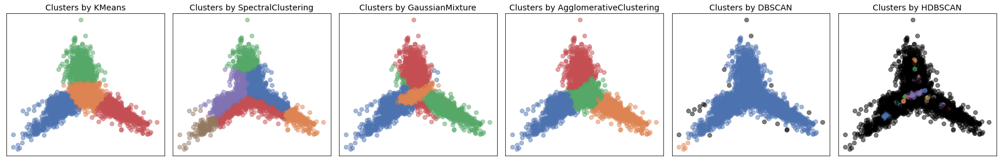

In [373]:
pca_data = apply_pca(vec_tfidf)

fig, axs = plt.subplots(1, 6, figsize=(24, 4))

plot_clusters(pca_data, cluster.KMeans, (), {'n_clusters': 4}, ax=axs[0])
plot_clusters(pca_data, cluster.SpectralClustering, (), {'n_clusters': 6}, ax=axs[1])
plot_clusters(pca_data, GMM.GaussianMixture, (), {'n_components': 4}, ax=axs[2])
plot_clusters(pca_data, cluster.AgglomerativeClustering, (), {'n_clusters': 4}, ax=axs[3])
plot_clusters(pca_data, cluster.DBSCAN, (), {'eps': 0.025}, ax=axs[4])
plot_clusters(pca_data, hdbscan.HDBSCAN, (), {'min_cluster_size': 15, 'min_samples': None, 'alpha': 1.0, 'cluster_selection_epsilon': 0.0, 'cluster_selection_method': 'eom', 'allow_single_cluster': False}, ax=axs[5])

fig.patch.set_facecolor('white')
plt.tight_layout()
plt.show()

### **Word2Vec**
- Word2Vec é um método de modelagem de linguagem e representação de palavras que utiliza redes neurais para aprender associações de palavras a partir de um grande corpus de texto.
- Existem dois modelos arquitetônicos para a implementação do Word2Vec:
    - CBOW (Continuous Bag of Words): Prevê a palavra atual com base no contexto.
    - Skip-gram: Usa uma palavra atual para prever o contexto.
- O treinamento do Word2Vec resulta em vetores de palavras onde palavras com contextos semelhantes resultam em vetores próximos uns dos outros no espaço vetorial, capturando assim suas semelhanças semânticas e sintáticas.
- Cada palavra é representada por um vetor denso, que é ajustado durante o treinamento para armazenar padrões linguísticos e semânticos.
- Uma característica distintiva do Word2Vec é a sua capacidade de capturar várias dimensões de significado, como gênero, pluralidade e até conceitos abstratos como poder ou conexão.
- Os vetores resultantes podem ser usados em várias aplicações de processamento de linguagem natural, como agrupamento de palavras, analogia de palavras e como características de entrada para outros modelos de aprendizado de máquina.

In [380]:
text_tokenized = df.filtered_text.apply(gensim.utils.simple_preprocess)

model = gensim.models.Word2Vec(
    window=10,
    min_count=2,
    workers=8
)

model.build_vocab(text_tokenized, progress_per=1000)

model.train(text_tokenized, total_examples=model.corpus_count, epochs=model.epochs)


(2630904, 2799335)

In [388]:
from sklearn.manifold import TSNE

def reduce_dimensions(model):
    num_components = 2  # number of dimensions to keep after compression

    # extract vocabulary from model and vectors in order to associate them in the graph
    vectors = np.asarray(model.wv.vectors)
    labels = np.asarray(model.wv.index_to_key)  

    # apply TSNE 
    tsne = TSNE(n_components=num_components, random_state=0)
    vectors = tsne.fit_transform(vectors)

    x_vals = [v[0] for v in vectors]
    y_vals = [v[1] for v in vectors]
    return x_vals, y_vals, labels


def plot_embeddings(x_vals, y_vals, labels):
    import plotly.graph_objs as go
    fig = go.Figure()
    trace = go.Scatter(x=x_vals, y=y_vals, mode='markers', text=labels)
    fig.add_trace(trace)
    fig.update_layout(title="Word2Vec - Visualizzazione embedding con TSNE")
    fig.show()
    return fig


x_vals, y_vals, labels = reduce_dimensions(model)

plot = plot_embeddings(x_vals, y_vals, labels)

In [265]:
# Mean value words
def document_vector(word2vec_model, doc):
    doc = [word for word in doc if word in word2vec_model.wv.key_to_index]
    
    if len(doc) == 0:
        return np.zeros(word2vec_model.vector_size)
    
    return np.mean(word2vec_model.wv[doc], axis=0)

# Apply Word2Vec
tokenized_docs = [doc.split() for doc in df.filtered_text]

# Treinar o modelo Word2Vec
model_w2v = Word2Vec(sentences=tokenized_docs, vector_size=300, window=5, min_count=2, workers=8)
model_w2v.train(tokenized_docs, total_examples=len(tokenized_docs), epochs=300)

# Vetorizar cada documento considerando a correção
vec_word2vec = np.array([document_vector(model_w2v, text) for text in tokenized_docs])

print(f'n_samples:{vec_word2vec.shape[0]}, num_features: {vec_word2vec.shape[1]}')
print('Shape:', vec_word2vec.shape)

n_samples:5026, num_features: 300
Shape: (5026, 300)


Explicação:
- vector_size é a dimensão do vetor de palavras, ou seja, quantos recursos cada palavra será representada.
    - vector_size=300 significa que cada palavra é representada por um vetor de 300 dimensões.
- window define o tamanho máximo da janela de palavras ao redor da palavra-alvo para considerar no contexto.
    - window=150 significa que o modelo leva em conta as 150 palavras antes e depois da palavra-alvo para aprender as representações vetoriais.
- min_count é o número mínimo de ocorrências de palavras para serem consideradas.
    - min_count=10 significa que o modelo ignora todas as palavras com frequência total menor que 10 em todo o corpus.
- sample é o limiar para configurar quais palavras de alta frequência são amostradas aleatoriamente; valores mais baixos significam menos amostragem.
    - sample=1e-3 é uma configuração que ajuda a equilibrar o aprendizado de palavras comuns e raras, potencialmente descartando algumas das ocorrências de palavras muito frequentes.

Descrição dos Parâmetros:
- O vector_size de 300 define uma representação rica e detalhada de cada palavra, capturando muitos aspectos semânticos.
- Um window de 150 permite que o modelo considere um contexto amplo ao redor de cada palavra, o que é particularmente útil para capturar relações semânticas em documentos mais longos.
- min_count de 10 assegura que apenas palavras com um mínimo de presença no corpus contribuam para o modelo, filtrando ruídos e palavras muito raras que podem não fornecer informações úteis.
- O parâmetro sample de 1e-3 equilibra a influência de palavras comuns e raras no aprendizado do modelo, ajudando a focar em palavras que oferecem informações únicas sobre os documentos.

### **K-Means (K=4)**
K-means é um algoritmo de aprendizagem não supervisionado. Usa aprendizado de máquina para analisar e agrupar conjuntos de dados não rotulados. Inicialmente passamos um número aleatório de K para ver seu desempenho. K corresponde ao número de grupos. Às vezes é difícil escolher um número ideal de K. Para tentar resolver isso, podemos usar algumas métricas como o método do cotovelo e a pontuação da Silhouette.

### **Elbow Method**
- Os métodos Elbow medem a distância euclidiana do ponto de dados ao seu cluster.
- Então nós elevamos ao quadrado e somamos todos eles.
- À medida que o número de clusters aumenta, cada ponto de dados terá um centro de cluster mais próximo dele. Resultando em uma soma decrescente de erros quadrados.
- O ponto principal é encontrar o "cotovelo" do gráfico, o que significa que ao aumentar o número de clusters estamos obtendo uma diminuição cada vez menos ideal da soma do erro quadrático, então o ponto do cotovelo deve ser o número ideal para o cluster.

### **Silhouette Method**
- Às vezes é difícil encontrar um bom ponto de cotovelo no gráfico de cotovelo anterior, então precisamos usar outra estratégia para encontrar o número ideal, o método Silhouette.
- O método Silhouette mede a distância entre cada cluster menos a distância dentro de cada cluster.
- Quanto maior o valor da pontuação da silhueta, melhor ela divide o conjunto de dados em diferentes clusters.

### **Optimization Number of Clusters**

  0%|          | 0/9 [00:00<?, ?it/s]

100%|██████████| 9/9 [00:29<00:00,  3.31s/it]


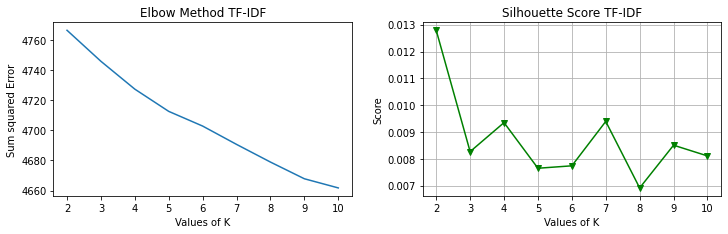

100%|██████████| 9/9 [00:08<00:00,  1.02it/s]


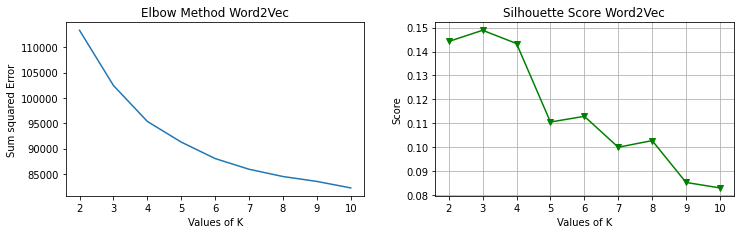

In [262]:
def optimise_kmeans(title, data, max_k):
    means = []
    inertias = []
    
    silhouette_avg = []
    
    for k in tqdm(range(2, max_k + 1)):
        kmeans = KMeans( n_clusters = k)
        kmeans.fit(data)
        means.append(k)
        inertias.append(kmeans.inertia_)
        
        # silhouette
        cluster_labels = kmeans.labels_
        silhouette_avg.append(silhouette_score(data, cluster_labels))
        #labels.append(k)

    
    fig, ax =  plt.subplots(1, 2, figsize = (10,3))
    fig.tight_layout(w_pad = 4)
    
    # Elbow method
    ax[0].plot(means, inertias)
    ax[0].set_title(f'Elbow Method {title}')
    ax[0].set_xlabel('Values of K')
    #plt.xticks(np.arange(1, k, 1))
    ax[0].set_ylabel('Sum squared Error')
    plt.grid(True)
    
    # Silhouette
    ax[1].plot(means, silhouette_avg , 'bv-', color = 'green')
    ax[1].set_title(f'Silhouette Score {title}')
    ax[1].set_xlabel('Values of K')
    ax[1].set_ylabel('Score')
    plt.grid(True)

    plt.show()
    
    
optimise_kmeans('TF-IDF', vec_tfidf, 10)
optimise_kmeans('Word2Vec', vec_word2vec, 10)

- Parece que o ponto do “cotovelo” não é tão fácil de encontrar, então não podemos definir um bom número para K.
- Com a ajuda da pontuação da silhueta, podemos ver a pontuação diminuindo drasticamente do cluster 2 para 3, e um pico no 4, porém depois desse ponto se torna um pouco caótico o gráfico.
- Dito isto, **vamos considerar o k = 4** pois foi o solicitado para o exercício.

### **Using TF-IDF**

In [273]:
kmeans = KMeans(init = 'random', n_clusters = 4, random_state=1, n_init=10)
kmeans.fit(vec_tfidf)

df['clusters_tfidf'] = kmeans.labels_

words = vectorizer.get_feature_names_out()[0:10]

# Greater TFIDF values
review_groups = df.clusters_tfidf.value_counts()
print(review_groups)

df

clusters_tfidf
1    2998
2     774
0     705
3     549
Name: count, dtype: int64


,text,filtered_text,clusters_tfidf,clusters_word2vec,x0,x1
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...,3,Sports,-0.095493,-0.058422
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter,1,Sports,0.021800,0.013111
2,"\nIt's bad jokes like that which draws crohns, I mean groans from the crowd...\nDon't bother loo...",it bad joke like draw crohn i mean groan crowd dont bother looking appendix useless anyway just ...,0,Sports,-0.026818,0.055704
3,"\n\nIf anyone gets the New York Times, the Edit page has a transcript\nof a VHS from Hams descri...",if anyone get new york time edit page transcript vhs ham describing method torture execution i p...,1,Religion,0.045703,0.014572
4,I apologize for the long delay in getting a response to this posted.\nI've been working reduced ...,i apologize long delay getting response posted ive working reduced hour past couple week i son b...,1,Sports,-0.072521,-0.069236
...,...,...,...,...,...,...
5021,Another issue of importance. Was the crucification the will of God or\na tragic mistake. I bel...,another issue importance wa crucification god tragic mistake i believe tragic mistake god never ...,3,Sports,-0.229858,-0.145850
5022,"tes:\n.\ns.\n\nOr mug me.\n\nWhy must you pursue this fantasy that all crime is derived from ""un...",te or mug why must pursue fantasy crime derived underground economy haaahaaaahaaaa yeah buddy ha...,1,Sports,-0.040164,-0.004412
5023,\n[ description of experiment deleted ]\n\n\n[ more deleted ]\n\n\nA few years ago a friend and ...,description experiment deleted deleted a year ago friend i took greylevel photo bit mac plus scr...,2,Religion,0.081571,-0.015953
5024,Chemical weapons are not concidered a *very* effectiv weapon against\nmillitary forces. On civil...,chemical weapon concidered effectiv weapon millitary force on civillians hand thats one good rea...,1,Sports,-0.009825,-0.006937


In [274]:
words = vectorizer.get_feature_names_out()

# 50 most common words from each group
common_words = kmeans.cluster_centers_.argsort()[:,-1:-51:-1]
for num, centroid in enumerate(common_words):
    print(str(num) + " : " + ', '.join(words[word] for word in centroid))

0 : game, team, player, year, season, play, win, hockey, last, league, fan, good, would, think, one, go, nhl, get, playoff, first, like, run, baseball, time, dont, well, hit, goal, best, toronto, better, ranger, two, leaf, pitching, know, let, back, brave, point, im, detroit, much, see, division, playing, pittsburgh, even, guy, pick
1 : would, people, one, dont, think, like, get, know, right, gun, time, say, government, state, well, israel, im, make, law, could, armenian, said, also, see, year, even, thing, israeli, post, much, many, go, question, want, way, point, good, day, first, use, case, really, jew, problem, article, still, arab, going, system, mean
2 : window, file, thanks, program, driver, anyone, card, know, please, email, use, graphic, image, using, problem, version, help, advance, doe, hi, format, mode, color, font, im, would, get, software, need, looking, ftp, like, system, work, directory, video, available, anybody, run, one, pc, find, also, package, info, site, screen, c

### **Renaming Clusters**
Cluster 0: Palavras como 'game', 'team', 'player', 'season', 'win', 'hockey', 'league', 'playoff', 'baseball', 'toronto', 'ranger', 'pitching', 'detroit', 'pittsburgh' estão todas relacionadas a esportes, com ênfase em hóquei e beisebol.

Cluster 1: Este cluster inclui 'people', 'right', 'gun', 'government', 'state', 'law', 'israel', 'armenian', 'jew', 'arab', o que indica um foco em questões sociais e políticas, possivelmente também englobando tópicos de conflitos internacionais e debates sobre direitos.

Cluster 2: 'window', 'file', 'program', 'driver', 'card', 'graphic', 'image', 'software', 'ftp', 'system', 'directory', 'screen' são todas palavras associadas à tecnologia, em particular software e computação.

Cluster 3: As palavras 'god', 'christian', 'jesus', 'bible', 'church', 'faith', 'religion', 'atheist', 'christianity', 'scripture', 'heaven' indicam uma conexão com religião e espiritualidade, abordando crenças, práticas e debates teológicos.

Logo, temos que:

- O cluster 0 parece estar relacionado com esportes.
- O cluster 1 parece conter notícias sobre politica.
- O Cluster 2 parece relacionado à tecnologia.
- O cluster 3 está relacionado à religião.

In [275]:
cluster_names = {
    0: 'Sports',
    1: 'Politics',
    2: 'Technology',
    3: 'Religion'
}

for num, centroid in enumerate(common_words):
    print(f"Cluster {num} ({cluster_names[num]}) : " + ', '.join(words[word] for word in centroid))

Cluster 0 (Sports) : game, team, player, year, season, play, win, hockey, last, league, fan, good, would, think, one, go, nhl, get, playoff, first, like, run, baseball, time, dont, well, hit, goal, best, toronto, better, ranger, two, leaf, pitching, know, let, back, brave, point, im, detroit, much, see, division, playing, pittsburgh, even, guy, pick
Cluster 1 (Politics) : would, people, one, dont, think, like, get, know, right, gun, time, say, government, state, well, israel, im, make, law, could, armenian, said, also, see, year, even, thing, israeli, post, much, many, go, question, want, way, point, good, day, first, use, case, really, jew, problem, article, still, arab, going, system, mean
Cluster 2 (Technology) : window, file, thanks, program, driver, anyone, card, know, please, email, use, graphic, image, using, problem, version, help, advance, doe, hi, format, mode, color, font, im, would, get, software, need, looking, ftp, like, system, work, directory, video, available, anybody,

In [276]:
# Renaming clusters
def cluster_names(cluster):
    if cluster == 0:
        return 'Sports'
    elif cluster == 1:
        return "Politics"
    elif cluster == 2:
        return 'Technology'
    elif cluster == 3:
        return 'Religion'
    
df.clusters_tfidf = df.clusters_tfidf.apply(cluster_names)
df

,text,filtered_text,clusters_tfidf,clusters_word2vec,x0,x1
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...,Religion,Sports,-0.095493,-0.058422
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter,Politics,Sports,0.021800,0.013111
2,"\nIt's bad jokes like that which draws crohns, I mean groans from the crowd...\nDon't bother loo...",it bad joke like draw crohn i mean groan crowd dont bother looking appendix useless anyway just ...,Sports,Sports,-0.026818,0.055704
3,"\n\nIf anyone gets the New York Times, the Edit page has a transcript\nof a VHS from Hams descri...",if anyone get new york time edit page transcript vhs ham describing method torture execution i p...,Politics,Religion,0.045703,0.014572
4,I apologize for the long delay in getting a response to this posted.\nI've been working reduced ...,i apologize long delay getting response posted ive working reduced hour past couple week i son b...,Politics,Sports,-0.072521,-0.069236
...,...,...,...,...,...,...
5021,Another issue of importance. Was the crucification the will of God or\na tragic mistake. I bel...,another issue importance wa crucification god tragic mistake i believe tragic mistake god never ...,Religion,Sports,-0.229858,-0.145850
5022,"tes:\n.\ns.\n\nOr mug me.\n\nWhy must you pursue this fantasy that all crime is derived from ""un...",te or mug why must pursue fantasy crime derived underground economy haaahaaaahaaaa yeah buddy ha...,Politics,Sports,-0.040164,-0.004412
5023,\n[ description of experiment deleted ]\n\n\n[ more deleted ]\n\n\nA few years ago a friend and ...,description experiment deleted deleted a year ago friend i took greylevel photo bit mac plus scr...,Technology,Religion,0.081571,-0.015953
5024,Chemical weapons are not concidered a *very* effectiv weapon against\nmillitary forces. On civil...,chemical weapon concidered effectiv weapon millitary force on civillians hand thats one good rea...,Politics,Sports,-0.009825,-0.006937


### **Examples of Each Cluster**

In [277]:
# show random samples of each group
def sample_reviews(data, amount = 1):
    
    print('')
    for i in data.clusters_tfidf.unique():
        print(f'cluster: {i}\n')
        for j in range(0, amount):
            print(data['text'][data['clusters_tfidf'] == i].sample(1))
            print('')
        print(f"{'=' * 90}\n")
        
sample_reviews(df, 1)


cluster: Religion

1308    \nThat would be neat, but nowhere in the Bible does it say\nthat one who has the gift of tounges...
Name: text, dtype: object


cluster: Politics

4562    #In <1qvabj$g1j@horus.ap.mchp.sni.de> frank@D012S658.uucp (Frank O'Dwyer) \n#\n#>In article <C5q...
Name: text, dtype: object


cluster: Sports

3439    Hi all,\n\nI don't get the sport's channel and I'm desparate for some playoff action\n(especiall...
Name: text, dtype: object


cluster: Technology

801    You have a lot more problems keeping up with hardware interrupts in Windows than\nin DOS - regar...
Name: text, dtype: object




### **Visualization of Topics**

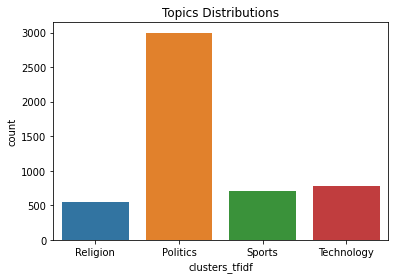

In [278]:
sns.countplot(x = df.clusters_tfidf)
plt.title('Topics Distributions')
plt.show()

### **Number of Words**

In [279]:
# Number of words
pd.set_option('max_colwidth', 100)
df['num_words'] = df["filtered_text"].apply(lambda x: x.split()).apply(len)
df.head(2)

,text,filtered_text,clusters_tfidf,clusters_word2vec,x0,x1,num_words
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...,Religion,Sports,-0.095493,-0.058422,71
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter,Politics,Sports,0.021800,0.013111,9


### **Number of Unique Words**

In [280]:
# Number of unique words
pd.set_option('max_colwidth', 100)
df['num_vocab'] = df['filtered_text'].apply(lambda x: x.split()).apply(set).apply(len)
df.head(2)

,text,filtered_text,clusters_tfidf,clusters_word2vec,x0,x1,num_words,num_vocab
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...,Religion,Sports,-0.095493,-0.058422,71,52
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter,Politics,Sports,0.021800,0.013111,9,9


### **Lexical Diversity**
- A diversidade lexical pode nos ajudar a compreender o quão complexo é um texto.
- Textos lexicalmente diversos utilizam uma ampla variedade de vocabulário, evitam repetições, usam linguagem precisa e tendem a usar sinônimos para expressar ideias.

In [281]:
df['lexical_div'] = df['num_words'] / df['num_vocab']
df.head(2)

,text,filtered_text,clusters_tfidf,clusters_word2vec,x0,x1,num_words,num_vocab,lexical_div
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...,Religion,Sports,-0.095493,-0.058422,71,52,1.365385
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter,Politics,Sports,0.021800,0.013111,9,9,1.000000


### **Average Word Length**

In [282]:
df["num_char"]=df["filtered_text"].str.len()
df['avg_word_length'] = df['num_char'] / df['num_words']
df.head(2)

,text,filtered_text,clusters_tfidf,clusters_word2vec,x0,x1,num_words,num_vocab,lexical_div,num_char,avg_word_length
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...,Religion,Sports,-0.095493,-0.058422,71,52,1.365385,454,6.394366
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter,Politics,Sports,0.021800,0.013111,9,9,1.000000,69,7.666667


### **Applying PCA**
- PCA nos ajuda a visualizar os dados agrupados.
- Como o nome sugere, reduz a dimensionalidade dos pontos de dados, deixando apenas os componentes principais para poder criar um gráfico de dispersão dos dados.
- É útil para verificar se escolhemos um número ideal para K na etapa de clusterização.

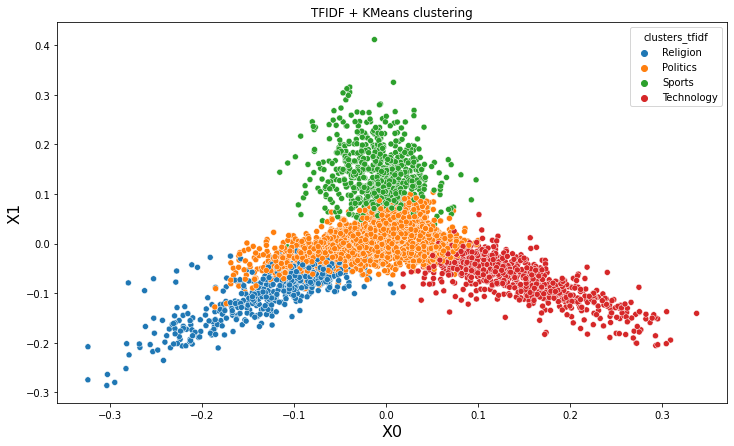

In [284]:
# Centroid of K-means
centroids = kmeans.cluster_centers_.argsort()[:, ::-1]

# PCA Decomposition
pca = PCA(n_components = 2, random_state = 42)
pca_vecs = pca.fit_transform(vec_tfidf.toarray())
x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]

# Define variables
df['x0'] = x0
df['x1'] = x1

# Plot graphic
plt.figure(figsize = (12, 7))
plt.title("TFIDF + KMeans clustering")
plt.xlabel("X0", fontdict = {'fontsize': 16})
plt.ylabel("X1", fontdict = {'fontsize': 16})
sns.scatterplot(data = df, x = 'x0', y = 'x1', hue = 'clusters_tfidf', palette = 'tab10')
plt.show()

### **Interactive View**

In [286]:
# Transforming the words vocabulary into a dataframe
clusters = vectorizer.vocabulary_

data  = {
    'Words': list(clusters.keys()),
    'Count': list(clusters.values())
}

df2 = pd.DataFrame(data)

# Visualizing groups
alt.Chart(df.sample(4000)).mark_circle(
    size = 100
).encode(
    x = 'x0',
    y = 'x1',
    color = 'clusters_tfidf:N',
    tooltip = 'text'
).properties(
    width=900,
    height=500
).interactive()

alt.Chart(...)

### **Using Word2Vec**

In [287]:
kmeans = KMeans(init = 'random', n_clusters = 4, random_state=1, n_init=10)
kmeans.fit(vec_word2vec)

df['clusters_word2vec'] = kmeans.labels_

words = vectorizer.get_feature_names_out()[0:10]

# Greater word2vec values
review_groups = df.clusters_word2vec.value_counts()
print(review_groups)

df

clusters_word2vec
0    1909
2    1103
3    1067
1     947
Name: count, dtype: int64


,text,filtered_text,clusters_tfidf,clusters_word2vec,x0,x1,num_words,num_vocab,lexical_div,num_char,avg_word_length
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...,Religion,0,-0.095493,-0.058422,71,52,1.365385,454,6.394366
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter,Politics,0,0.021800,0.013111,9,9,1.000000,69,7.666667
2,"\nIt's bad jokes like that which draws crohns, I mean groans from the crowd...\nDon't bother loo...",it bad joke like draw crohn i mean groan crowd dont bother looking appendix useless anyway just ...,Sports,0,-0.026818,0.055704,30,30,1.000000,163,5.433333
3,"\n\nIf anyone gets the New York Times, the Edit page has a transcript\nof a VHS from Hams descri...",if anyone get new york time edit page transcript vhs ham describing method torture execution i p...,Politics,3,0.045703,0.014572,18,18,1.000000,105,5.833333
4,I apologize for the long delay in getting a response to this posted.\nI've been working reduced ...,i apologize long delay getting response posted ive working reduced hour past couple week i son b...,Politics,0,-0.072521,-0.069236,261,175,1.491429,1770,6.781609
...,...,...,...,...,...,...,...,...,...,...,...
5021,Another issue of importance. Was the crucification the will of God or\na tragic mistake. I bel...,another issue importance wa crucification god tragic mistake i believe tragic mistake god never ...,Religion,0,-0.229858,-0.145850,236,154,1.532468,1554,6.584746
5022,"tes:\n.\ns.\n\nOr mug me.\n\nWhy must you pursue this fantasy that all crime is derived from ""un...",te or mug why must pursue fantasy crime derived underground economy haaahaaaahaaaa yeah buddy ha...,Politics,0,-0.040164,-0.004412,44,38,1.157895,241,5.477273
5023,\n[ description of experiment deleted ]\n\n\n[ more deleted ]\n\n\nA few years ago a friend and ...,description experiment deleted deleted a year ago friend i took greylevel photo bit mac plus scr...,Technology,3,0.081571,-0.015953,128,103,1.242718,857,6.695312
5024,Chemical weapons are not concidered a *very* effectiv weapon against\nmillitary forces. On civil...,chemical weapon concidered effectiv weapon millitary force on civillians hand thats one good rea...,Politics,0,-0.009825,-0.006937,53,48,1.104167,364,6.867925


In [288]:
words = vectorizer.get_feature_names_out()

# 50 most common words from each group
common_words = kmeans.cluster_centers_.argsort()[:,-1:-51:-1]
for num, centroid in enumerate(common_words):
    print(str(num) + " : " + ', '.join(words[word] for word in centroid))

0 : ambition, absolutely, amend, alex, ah, amen, affiliated, agrees, accessed, alexandria, adopted, activity, acquired, along, addressed, affair, ace, advantage, adam, amiga, acton, aka, adirondack, adultery, abandon, affecting, abroad, abc, ab, aired, abstinence, afternoon, america, allen, alien, adult, although, american, adjustment, amateur, administrative, algorithm, abolished, admits, alcohol, african, africanamerican, accomplished, agent, alltime
1 : adam, american, allegation, affect, achieved, aegean, adubinskivmscsdmuedu, amiga, alien, accessed, agenda, administrative, alan, abandon, amend, accepted, ace, adolf, absolutely, affair, along, ab, age, abroad, acquiring, allowing, abundant, absurdity, advice, addict, adjustment, africanamerican, accident, abc, al, adding, ambition, accessory, ahmet, albert, aclu, advantage, adultery, aircraft, agony, almighty, algorithm, allegedly, absorb, ak
2 : ambition, affiliated, alex, agrees, addicted, ah, abraham, advantage, alice, acton, af

In [289]:
# Renaming clusters
def cluster_names(cluster):
    if cluster == 0:
        return 'Sports'
    elif cluster == 1:
        return "Politics"
    elif cluster == 2:
        return 'Technology'
    elif cluster == 3:
        return 'Religion'
    
df.clusters_word2vec = df.clusters_word2vec.apply(cluster_names)
df

,text,filtered_text,clusters_tfidf,clusters_word2vec,x0,x1,num_words,num_vocab,lexical_div,num_char,avg_word_length
0,"\n\nI have discussed this with my girlfriend often. I consider myself married,\nthough legally ...",i discussed girlfriend often i consider married though legally i neither u people sexually altho...,Religion,Sports,-0.095493,-0.058422,71,52,1.365385,454,6.394366
1,\nYou might want to re-think your attitude about the Holocaust after\nreading Deuteronomy chapte...,you might want rethink attitude holocaust reading deuteronomy chapter,Politics,Sports,0.021800,0.013111,9,9,1.000000,69,7.666667
2,"\nIt's bad jokes like that which draws crohns, I mean groans from the crowd...\nDon't bother loo...",it bad joke like draw crohn i mean groan crowd dont bother looking appendix useless anyway just ...,Sports,Sports,-0.026818,0.055704,30,30,1.000000,163,5.433333
3,"\n\nIf anyone gets the New York Times, the Edit page has a transcript\nof a VHS from Hams descri...",if anyone get new york time edit page transcript vhs ham describing method torture execution i p...,Politics,Religion,0.045703,0.014572,18,18,1.000000,105,5.833333
4,I apologize for the long delay in getting a response to this posted.\nI've been working reduced ...,i apologize long delay getting response posted ive working reduced hour past couple week i son b...,Politics,Sports,-0.072521,-0.069236,261,175,1.491429,1770,6.781609
...,...,...,...,...,...,...,...,...,...,...,...
5021,Another issue of importance. Was the crucification the will of God or\na tragic mistake. I bel...,another issue importance wa crucification god tragic mistake i believe tragic mistake god never ...,Religion,Sports,-0.229858,-0.145850,236,154,1.532468,1554,6.584746
5022,"tes:\n.\ns.\n\nOr mug me.\n\nWhy must you pursue this fantasy that all crime is derived from ""un...",te or mug why must pursue fantasy crime derived underground economy haaahaaaahaaaa yeah buddy ha...,Politics,Sports,-0.040164,-0.004412,44,38,1.157895,241,5.477273
5023,\n[ description of experiment deleted ]\n\n\n[ more deleted ]\n\n\nA few years ago a friend and ...,description experiment deleted deleted a year ago friend i took greylevel photo bit mac plus scr...,Technology,Religion,0.081571,-0.015953,128,103,1.242718,857,6.695312
5024,Chemical weapons are not concidered a *very* effectiv weapon against\nmillitary forces. On civil...,chemical weapon concidered effectiv weapon millitary force on civillians hand thats one good rea...,Politics,Sports,-0.009825,-0.006937,53,48,1.104167,364,6.867925


### **Visualization of Topics**

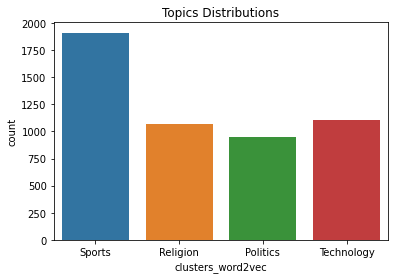

In [290]:
sns.countplot(x = df.clusters_word2vec)
plt.title('Topics Distributions')
plt.show()

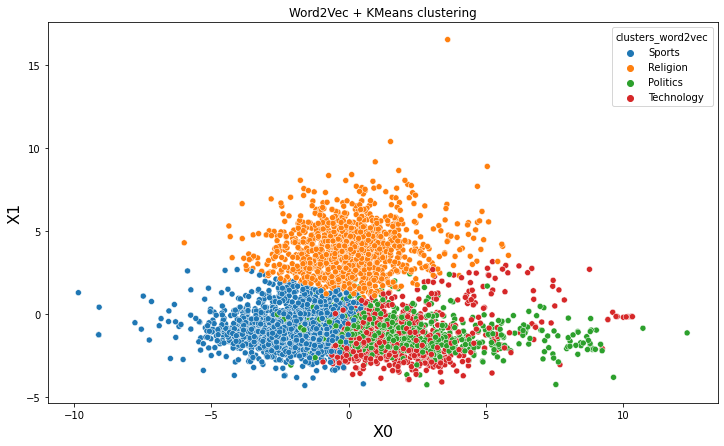

In [294]:
# Centroid of K-means
centroids = kmeans.cluster_centers_.argsort()[:, ::-1]

# PCA Decomposition
pca = PCA(n_components = 2, random_state = 42)
pca_vecs = pca.fit_transform(vec_word2vec)
x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]

# Define variables
df['x0'] = x0
df['x1'] = x1

# Plot graphic
plt.figure(figsize = (12, 7))
plt.title("Word2Vec + KMeans clustering")
plt.xlabel("X0", fontdict = {'fontsize': 16})
plt.ylabel("X1", fontdict = {'fontsize': 16})
sns.scatterplot(data = df, x = 'x0', y = 'x1', hue = 'clusters_word2vec', palette = 'tab10')
plt.show()

### **Spectral Clustering (K=6)**

ValueError: 'c' argument has 5026 elements, which is inconsistent with 'x' and 'y' with size 1.

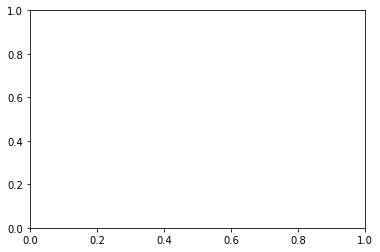

In [297]:
import sklearn.cluster as cluster
plot_kwds = {'alpha': 0.25, 's': 80, 'linewidths': 0}

def plot_clusters(data, algorithm, args, kwds):
    start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    plt.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
    frame = plt.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    plt.title(f'Clusters by {str(algorithm.__name__)}', fontsize=10)
    plt.text(-0.5, 0.6, 'Running Time {:.2f} s'.format(end_time - start_time), fontsize=14)
    
plot_clusters(vec_tfidf, cluster.SpectralClustering, (), {'n_clusters': 6})

### **Gaussian Mixture**

### **Agglomerative Clustering**

### **DBSCAN**

### **HDBSCAN**